## Objective

The aim of the `Picasso` project is to utilize AI, specifically a `Diffusion` model, for the creation of paintings that closely mimic the style of a Impressionist landscape paintings. Additionally, the model can be easily retrained on various datasets to replicate their styles in generated images.

Here are a few potential use cases for this model:

- **Content Creation**: Support content creators by offering a tool for generating original artwork for various purposes such as illustrations, graphics, and multimedia projects.

- **Personalized Art**: Allow individuals to generate custom paintings tailored to their preferences, providing a unique and personalized artistic experience.


## Dataset

In this project, we will utilize a dataset comprising 5000 Impressionist landscape paintings sourced from Kaggle. The objective is for the model to grasp the nuances of these paintings' styles and subsequently generate novel samples accordingly.

In [ ]:
# download & unzip the dataset from Kaggle

!kaggle datasets download -d robgonsalves/impressionistlandscapespaintings
!unzip -j -q -o impressionistlandscapespaintings.zip -d paintings

Dataset URL: https://www.kaggle.com/datasets/robgonsalves/impressionistlandscapespaintings
License(s): CC-BY-SA-4.0
100% 1.00G/1.00G [00:35<00:00, 31.6MB/s]
100% 1.00G/1.00G [00:35<00:00, 30.6MB/s]


First, let's confirm the number of paintings in our dataset.

In [ ]:
import glob
images_dir = 'paintings'

# Get a list of all image files in the paintings folder
image_paths = glob.glob(f'{images_dir}/*.jpg')
print(f'found {len(image_paths)} images')

found 5000 images


Here, we'll illustrate a few samples

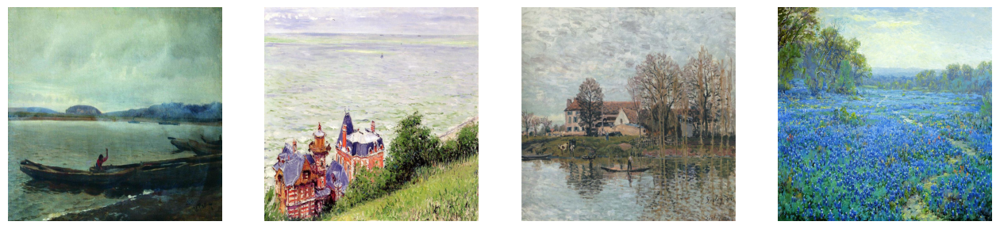

In [ ]:
# Plot random images from the list
import random
import matplotlib.pyplot as plt

n_sample_images = 4
selected_images = random.sample(image_paths, n_sample_images)

# Plot the selected images
fig, axes = plt.subplots(1, n_sample_images, figsize=(n_sample_images*4, 4))
for i, image_path in enumerate(selected_images):
    ax = axes.flat[i]
    img = plt.imread(image_path)
    ax.imshow(img)
    ax.axis('off')

plt.show()

## Diffusion Model

A diffusion model is a type of generative model used in machine learning, particularly in image generation tasks. Here is how it works:

- **Forward Process (Diffusion)**: Start with a clean image and gradually add Gaussian noise over a fixed number of steps, transforming it into a noisy image. This sequence of progressively noisier images eventually resemble pure noise.

- **Reverse Process (Denoising)**: During training, the model learns how to reverse the noise addition process by denoise an image step-by-step, starting from pure noise and gradually refining it to resemble the original clean image.
   
- **Generation Phase**: To generate a new image, the model starts with a sample of pure noise, then applies the learned reverse process iteratively until a clean, high-quality image is formed.

Here's a brief description of our chosen model parameters:

- **img_height = 64**: This parameter specifies the height of the images that will be used as input or generated by the model. In this case, the height is set to 64 pixels.

- **img_width = 64**: Similar to img_height, this parameter defines the width of the images, also set to 64 pixels.

- **channels = 3**: Channels refer to the color channels in an image. In RGB images, there are typically three channels: red, green, and blue. This parameter indicates that each image in the dataset or generated by the model has three color channels.

- **time_steps = 4000**: This parameter represents the number of diffusion steps or iterations that the diffusion model will go through during training or generation. Each diffusion step involves updating the latent variables and refining the generated output. In this case, the model will go through 4000 diffusion steps.

In [5]:
# Model parameters
img_height = 64
img_width = 64
channels = 3
time_steps = 4000


### Image preprocessing

The dataset comprises color paintings with dimensions of 1024 x 1024 pixels. To simplify the training of the diffusion model and conserve resources, we will resize all images to a uniform size of 64 x 64 pixels. These resized images will serve as both the input and target for the model.

The `load_and_process_image` function retrieves an image from a file path, adjusts its dimensions to a designated target size (defaulting to 64 x 64 pixels), and ensures its pixel values are within the range of [-1, 1]. Scaling the pixel values of an image to the range of [-1, 1] ensures consistency with the random Gaussian noise added at each diffusion step in the model. By maintaining this consistent scale, the noise introduced during training aligns effectively with the image data, enhancing the model's ability to learn and generate accurate representations of the desired output. Additionally, if the `to_grayscale` flag is enabled, it converts the images to grayscale.

In [ ]:
# Load, resize, and normalize an image.
import tensorflow as tf
from typing import List, Tuple, Dict, Any


def load_and_process_image(image_path: str, target_size: Tuple[int, int] = (img_width, img_height), 
                           to_grayscale: bool = False) -> tf.Tensor:
    """
    Loads and preprocesses the image located at the specified path.

    Args:
        image_path (str): Path to the image file.
        target_size (Tuple[int, int], optional): Desired size for the image. Defaults to (img_width, img_height).
        to_grayscale (bool, optional): Flag indicating whether to convert the image to grayscale. Defaults to False.

    Returns:
        tf.Tensor: Preprocessed image tensor.
    """
    # Load the image
    img = tf.io.read_file(image_path)

    # Decode the image
    img = tf.image.decode_image(img, channels=3, expand_animations=False)

    # Convert the image to grayscale
    if to_grayscale:
        img = tf.image.rgb_to_grayscale(img)

    # Resize the image
    img = tf.image.resize(img, target_size)

    # Normalize the image to [-1, 1]
    img = (img / 127.5) - 1.0
    return img

To illustrate the impact of our preprocessing function, we will examine a sample image from the dataset and compare its original with the processed versions.

As demonstrated below, reducing the image size results in a significant loss of resolution. However, this trade-off facilitates the training process of the model and decreases the overall model size.

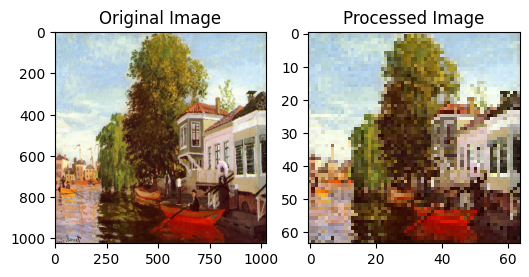

In [ ]:
# Select an image from the dataset
sample_image_path = random.choice(image_paths)

# Load and process the image
processed_image = load_and_process_image(sample_image_path)

# Plot the original and processed images
fig, axes = plt.subplots(1, 2, figsize=(6, 3))
axes[0].imshow(plt.imread(sample_image_path))
axes[0].set_title('Original Image')

axes[1].imshow(.5 * (processed_image + 1.))
axes[1].set_title('Processed Image')

plt.show()

### Variance schedule

The variance schedule is a crucial component in diffusion models, particularly in the context of image generation tasks. 
Beginning with an image from the dataset, the diffusion process involves adding Gaussian noise with a mean of 0 and a variance denoted by $\beta(t)$ at each time step t. Subsequently, the model is trained to reverse this process. Specifically, when presented with a noisy image generated during the forward process and the corresponding time $t$, the model learns to predict the total noise that was initially added to the original image, scaled to a variance of 1.

The recommendation outlined in the [Improved DDPM paper](https://arxiv.org/pdf/2102.09672.pdf) suggests employing the Cos schedule, as implemented below. In this equation $\alpha(t) = 1 - \beta(t)$, and `alphas_cumprod(t)` is the cumulative product of $\alpha(t)$. The cumulative product gradually decreases from 1 to 0.

In [6]:
# Variance schedule as proposed in the original diffusion paper
import numpy as np
def variance_schedule(time_steps, s=0.008, max_beta=0.999):
    t = np.arange(time_steps + 1)
    f = np.cos((t / time_steps + s) / (1 + s) * np.pi / 2) ** 2
    alphas = np.clip(f[1:] / f[:-1], 1 - max_beta, 1)
    alphas = np.append(1, alphas).astype(np.float32)  # add α₀ = 1
    betas = 1 - alphas
    alphas_cumprod = np.cumprod(alphas)
    return alphas, alphas_cumprod, betas

alphas, alphas_cumprod, betas = variance_schedule(time_steps)

### Generate noisy images

In order to train the model, we require noisy images at different time steps. To achieve this, we'll utilize the `generate_noisy_data` function to create noisy images at random time steps based on the original image, by performing the following steps:

- It loads and processes the input image from the specified image path, ensuring it matches the desired target size.
- Randomly selects a time step `t` from the range of available time steps. This is known as Randomized Time Sampling, allowing the model to learn from different stages of the diffusion process in a stochastic manner.
- Generates Gaussian noise with the same shape as the processed image.
- Combines the processed image and the generated noise using the diffusion process formula to produce the noisy image `Xt`. Note that rather than adding noise iteratively `t` times, this function adopts a shortcut method proposed in the DDPM paper to directly compute the noisy image at the specified time step `t`.

Finally, this function outputs a dictionary containing:
- `Xt`: A noisy image generated by applying Gaussian noise to the processed image.
- `t`: A randomly selected time step `t` utilized in the diffusion process.



In [7]:
def generate_noisy_data(image_path: str, time_steps: int = time_steps, 
                        target_size: Tuple[int, int] = (img_width, img_height)) -> Tuple[Dict[str, Any], tf.Tensor]:
    """
    Generates noisy data based on the input image path.

    Args:
        image_path (str): Path to the input image.
        time_steps (int, optional): Number of diffusion steps. Defaults to time_steps.
        target_size (Tuple[int, int], optional): Desired size for the image. Defaults to (img_width, img_height).

    Returns:
        Tuple[Dict[str, Any], tf.Tensor]: A tuple containing a dictionary with keys 'Xt' and 't', representing 
        the noisy image and the randomly selected time step 't', respectively, and the generated noise tensor.
    """
    image = load_and_process_image(image_path, target_size=target_size)
    t = tf.random.uniform([], minval=0, maxval=time_steps, dtype=tf.int32)
    sqrt_alpha_cumprod_t = tf.sqrt(tf.gather(alphas_cumprod, t))
    sqrt_one_minus_alpha_cumprod_t = tf.sqrt(1.0 - tf.gather(alphas_cumprod, t))
    noise = tf.random.normal(shape=tf.shape(image))
    Xt = sqrt_alpha_cumprod_t * image + sqrt_one_minus_alpha_cumprod_t * noise
    return {'Xt':Xt, 't':t}, noise

To showcase the forward diffusion process, we'll generate and display 10 distinct noisy samples. As depicted below, as the number of time steps increases, the image progressively resembles pure random noise, as anticipated.

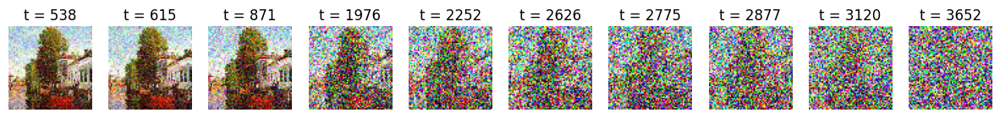

In [ ]:
fig, axes = plt.subplots(1, 10, figsize=(15, 3))
noisy_images = [generate_noisy_data(sample_image_path)[0] for _ in range (10)]
noisy_images = sorted(noisy_images, key=lambda x: x['t'])

for i in range(10):
    Xt, t = noisy_images[i]['Xt'], noisy_images[i]['t']
    axes[i].imshow(.5 * (Xt + 1.))
    axes[i].set_title(f't = {t}')
    axes[i].axis('off')

plt.show()


### Create TF datasets


Utilizing `train_test_split` function, we'll allocate 20% of the data for validation.

In [ ]:
from sklearn.model_selection import train_test_split

image_paths_train, image_paths_valid = train_test_split(image_paths, test_size=0.2, random_state=42)

This `create_tf_dataset` function creates a TensorFlow dataset `dataset` from a list of image paths (`image_paths`) and applies a series of operations to prepare it for training:

- **From Tensor Slices**: It initializes the dataset using `tf.data.Dataset.from_tensor_slices`, which creates a dataset from a list or array of elements, in this case, the image paths.

- **Map Function**: It applies the `generate_noisy_data` function to each element (image path) in the dataset using `map`. This function generates noisy images based on the input image paths.

- **Shuffle**: It shuffles the dataset using `shuffle`, which randomly shuffles the elements with a buffer size of 1000 to ensure randomness while training.

- **Batching**: It batches the dataset using `batch`, grouping consecutive elements together to form batches of a specified size (`batch_size`).

- **Prefetching**: It prefetches one batch using `prefetch(1)`, allowing the next batch of data to be prepared asynchronously while the current batch is being processed, improving training performance.



In [ ]:
def create_tf_dataset(image_paths: List[str], batch_size: int = 32) -> tf.data.Dataset:
    """
    Creates a TensorFlow dataset for training or validation.

    Args:
        image_paths (List[str]): List of image file paths.
        batch_size (int, optional): Batch size for the dataset. Defaults to 32.

    Returns:
        tf.data.Dataset: TensorFlow dataset containing noisy images.

    """
    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(lambda image_path: generate_noisy_data(image_path))
    dataset = dataset.shuffle(buffer_size=1000).batch(batch_size).prefetch(1)

    return dataset

dataset_train = create_tf_dataset(image_paths_train)
dataset_valid = create_tf_dataset(image_paths_valid)

In [ ]:
dataset_train

<_PrefetchDataset element_spec=({'Xt': TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None), 't': TensorSpec(shape=(None,), dtype=tf.int32, name=None)}, TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None))>

### Time encoding


In diffusion models, time encoding is a technique used to represent the progression of diffusion steps during training. Time encoding ensures that the model learns to differentiate between different stages of the diffusion process and effectively handles the noise accumulation at each step. There are various ways to encode time in diffusion models. Here, we'll use sinusoidal encoding to represent the progression of time, as recommended in the DDPM paper.

In [9]:
# a custom time encoding layer

time_embedding_size = 64

class TimeEncoding(tf.keras.layers.Layer):
    def __init__(self, time_steps, embed_size):
        super().__init__()
        p, i = np.meshgrid(np.arange(time_steps), 2 * np.arange(embed_size // 2))
        t_emb = np.empty((time_steps, embed_size))
        t_emb[:, ::2] = np.sin(p / 10_000 ** (i / embed_size)).T
        t_emb[:, 1::2] = np.cos(p / 10_000 ** (i / embed_size)).T
        self.time_encodings = tf.constant(t_emb, dtype=tf.float32)

    def call(self, inputs):
        return tf.gather(self.time_encodings, inputs)

Here's a depiction of our sinusoidal time encoding. 
The dimensions of the encoding matrix are selected as the embedding size (64) by the number of time steps (4000).

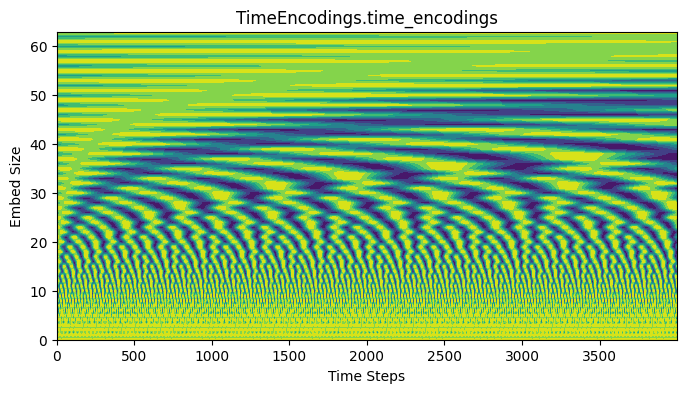

In [ ]:
time_encodings = TimeEncoding(time_steps, time_embedding_size).time_encodings

fig, ax = plt.subplots(figsize=(8, 4))

# Plot the time encodings as a 2D contour
ax.contourf(tf.transpose(time_encodings))

# Add labels and title
ax.set_xlabel('Time Steps')
ax.set_ylabel('Embed Size')
ax.set_title('TimeEncodings.time_encodings')

plt.show()

### Create the model


The model architecture follows a U-Net structure, which is characterized by:

- **Encoder Path**: 
  - Begins with convolutional blocks followed by downsampling operations (e.g., max pooling).
  - These blocks progressively reduce the spatial dimensions of the input image while increasing the number of feature maps.
  - The feature maps at each downsampling step capture hierarchical representations of the input image.

- **Bridge**: 
  - Consists of additional convolutional blocks after the deepest downsampling operation.
  - Enhances the model's ability to capture complex features and maintain spatial information.

- **Decoder Path**: 
  - Begins with convolutional transpose blocks followed by upsampling operations.
  - These blocks progressively increase the spatial dimensions of the feature maps while reducing the number of feature maps.
  - The feature maps are concatenated with corresponding feature maps from the encoder path (skip connections) to mitigate information loss during downsampling.

- **Output Layer**: 
  - A convolutional layer that generates the final output, typically with the same spatial dimensions as the input image.
  - The output represents the reconstructed image or the desired prediction.


In [10]:
# creating the model

def conv_block(inputs, filters, kernel_size=3, padding='same'):
    Z = tf.keras.layers.Conv2D(filters, kernel_size, padding=padding)(inputs)
    Z = tf.keras.layers.BatchNormalization()(Z)
    Z = tf.keras.layers.Activation("relu")(Z)
    return Z

def sepconv_block(inputs, filters, kernel_size=3, padding='same'):
    Z = tf.keras.layers.SeparableConv2D(filters, kernel_size, padding=padding)(inputs)
    Z = tf.keras.layers.BatchNormalization()(Z)
    Z = tf.keras.layers.Activation("relu")(Z)
    return Z

def convtr_block(inputs, filters, kernel_size=3, strides=1, padding='same'):
    Z = tf.keras.layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)(inputs)
    Z = tf.keras.layers.BatchNormalization()(Z)
    Z = tf.keras.layers.Activation("relu")(Z)
    return Z

def add_time_block(Z, time_embedding):
    dim = Z.shape[-1]
    time = tf.keras.layers.Dense(dim)(time_embedding)
    time = time[:, tf.newaxis, tf.newaxis, :]  # Add two new axes to time
    return Z+time  # Add time data to every pixel

def build_model(input_shape, time_steps, time_embedding_size, num_filters):
    Xt = tf.keras.layers.Input(shape=input_shape, name='Xt')
    t = tf.keras.layers.Input(shape=[], dtype=tf.int32, name='t')

    time_embedding = TimeEncoding(time_steps, time_embedding_size)(t)

    filters = num_filters[0]//2
    Z = conv_block(Xt, filters)
    Z = add_time_block(Z, time_embedding)

    encoder_layers = []
    for filters in num_filters:
        Z = conv_block(Z, filters)
        skip_connection = Z  # Store the feature maps for skip connection
        Z = conv_block(Z, filters)
        Z = tf.keras.layers.MaxPooling2D((2, 2))(Z)
        Z = add_time_block(Z, time_embedding)
        encoder_layers.append(skip_connection)  # Append feature maps for skip connection

    Z = conv_block(Z, num_filters[-1]*2)

    for filters, encoder_layer in zip(num_filters[::-1], encoder_layers[::-1]):
        Z = convtr_block(Z, filters, strides=2)
        Z = tf.keras.layers.Concatenate()([Z, encoder_layer])  # Concatenate with skip connection
        Z = conv_block(Z, filters)
        Z = conv_block(Z, filters)
        Z = add_time_block(Z, time_embedding)

    outputs = tf.keras.layers.Conv2D(channels, 1)(Z)

    model = tf.keras.Model(inputs=[Xt, t], outputs=[outputs])
    return model


# img_width, img_height, channels = 64, 64, 3
# time_steps, time_embedding_size = 4000, 64
num_filters = [32, 64, 128]

model = build_model((img_width, img_height, channels), time_steps, time_embedding_size, num_filters)
model.compile(loss=tf.keras.losses.Huber(), optimizer="nadam")
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 Xt (InputLayer)             [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 t (InputLayer)              [(None,)]                    0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 64, 64, 16)           448       ['Xt[0][0]']                  
                                                                                                  
 time_encoding (TimeEncodin  (None, 64)                   0         ['t[0][0]']                   
 g)                                                                                           

### Model vizualization


Utilizing `tf.keras.utils.plot_model` allows us to visually represent our model, providing a clearer understanding of its different components and their interconnections.

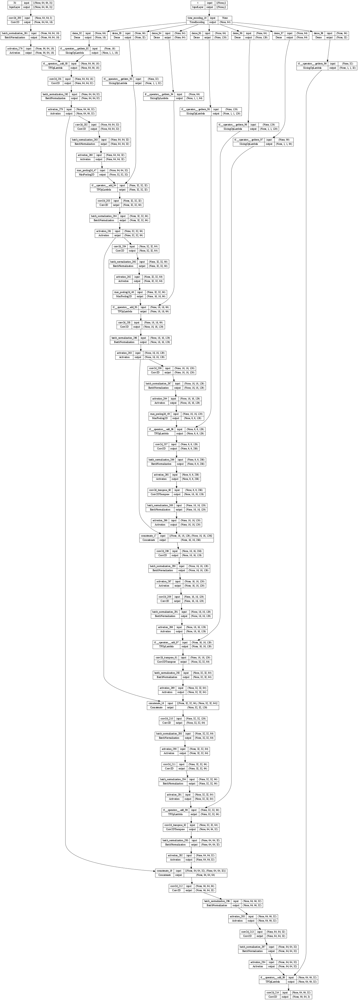

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, dpi=50)

### Training the model


To optimize training, we'll implement `ModelCheckpoint` and `EarlyStopping` callbacks. 

`ModelCheckpoint` records the model's weights during training, enabling progress tracking and the ability to resume training from the last saved point. On the other hand, `EarlyStopping` halts training prematurely if a specified metric (such as validation loss) ceases to improve, thereby preventing overfitting and conserving computational resources.

In [ ]:
# Train the model
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("my_diffusion_model",
                                                   save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                     patience=10,
                                                     min_delta=0.0001,
                                                     restore_best_weights=True)

epochs = 100
history = model.fit(dataset_train, validation_data=dataset_valid, epochs=epochs,
                    callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/100
125/125 [==============================] - 68s 336ms/step - loss: 0.2960 - val_loss: 0.2248
Epoch 2/100
125/125 [==============================] - 45s 316ms/step - loss: 0.1222 - val_loss: 0.1211
Epoch 3/100
125/125 [==============================] - 44s 313ms/step - loss: 0.0978 - val_loss: 0.1037
Epoch 4/100
125/125 [==============================] - 34s 233ms/step - loss: 0.0829 - val_loss: 0.1051
Epoch 5/100
125/125 [==============================] - 46s 322ms/step - loss: 0.0774 - val_loss: 0.0853
Epoch 6/100
125/125 [==============================] - 44s 298ms/step - loss: 0.0738 - val_loss: 0.0710
Epoch 7/100
125/125 [==============================] - 39s 254ms/step - loss: 0.0717 - val_loss: 0.0783
Epoch 8/100
125/125 [==============================] - 35s 238ms/step - loss: 0.0700 - val_loss: 0.0774
Epoch 9/100
125/125 [==============================] - 35s 229ms/step - loss: 0.0676 - val_loss: 0.1048
Epoch 10/100
125/125 [==============================] - 41s 286m

### Model evaluation


The model halted training at the 47th epoch as a result of the early stopping callback. Now, let's examine the training and validation loss.

It appears that the validation loss spiked on a few occasions, but the model managed to recover swiftly.

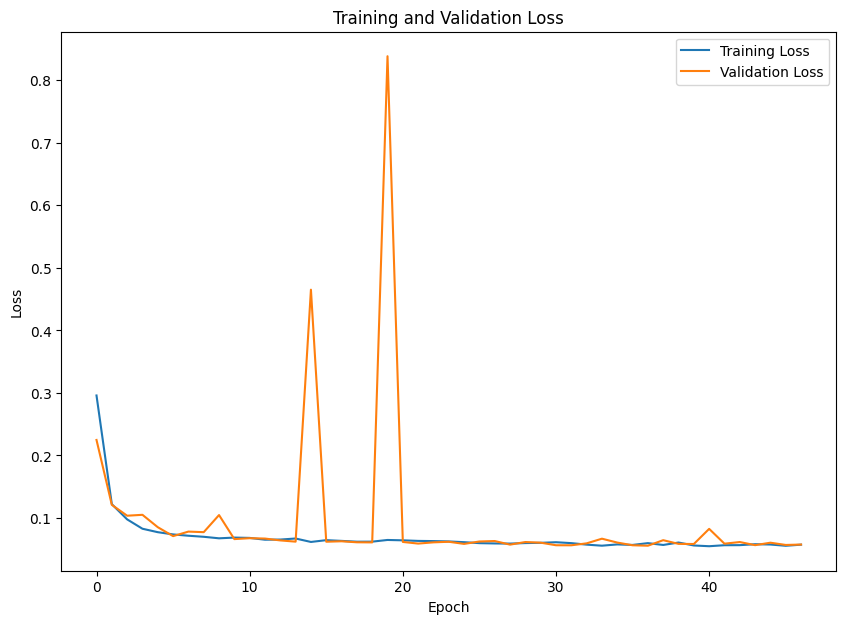

In [ ]:
# plot training and validation loss

fig, ax = plt.subplots(figsize=(10, 7))

ax.plot(history.history['loss'], label='Training Loss')
ax.plot(history.history['val_loss'], label='Validation Loss')

ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.set_title('Training and Validation Loss')

ax.legend()
plt.show()

Considering that training diffusion models typically requires a substantial amount of time, it's advisable to save the model once the training process is complete. We'll utilize TensorFlow's default format for this purpose.

Additionally, we can compress the saved model for enhanced portability.

In [37]:
model.save('Picasso')
# !zip -r Picasso.zip Picasso

  adding: Picasso/ (stored 0%)
  adding: Picasso/fingerprint.pb (stored 0%)
  adding: Picasso/variables/ (stored 0%)
  adding: Picasso/variables/variables.index (deflated 74%)
  adding: Picasso/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: Picasso/saved_model.pb (deflated 52%)
  adding: Picasso/assets/ (stored 0%)
  adding: Picasso/keras_metadata.pb (deflated 94%)


Now we can load and use the saved model at any time using `tf.keras.models.load_model`

In [ ]:
# !unzip -j -q -o Picasso.zip -d Picasso
model = tf.keras.models.load_model('Picasso')

## Image generation

Now we can use the trained diffusion model to generate new images through an iterative denoising process:

- **Initialization**: Start with a batch of Gaussian noise as the initial input, assuming it represents the result of a diffusion process at time T.
- **Iterative Denoising**: For each time step t from the last to the first:
   - Generate noise (Gaussian noise if t, otherwise zeros).
   - Use the model to predict the noise component in the input image at time t.
   - Update the image by removing the predicted noise.

Finally, this function returns the generated images. Moreover, if `return_history=True`, we will retain and return the intermediate steps.

In [16]:
from tqdm import tqdm

def generate_image(n_images: int, return_history: bool = False, interval: int = 100) -> List[np.ndarray]:
    """
    Generates images using the trained diffusion model.

    Args:
        n_images (int): Number of images to generate.
        return_history (bool, optional): Whether to return the history of generated images. Defaults to False.
        interval (int, optional): Interval for returning generated images when return_history is True. Defaults to 100.

    Returns:
        List[np.ndarray]: Generated images or history of generated images depending on return_history.

    """
    generated_images = []
    X = tf.random.normal([n_images, img_width, img_height, channels])
    for t in tqdm(range(time_steps - 1, 0, -1), desc=f'generate_image(n_images={n_images})'):
        noise = (tf.random.normal if t > 1 else tf.zeros)(tf.shape(X))
        X_noise = model({"Xt": X, "t": tf.constant([t]*n_images)})
        X = (1 / alphas[t] ** 0.5
             * (X - betas[t] / (1 - alphas_cumprod[t]) ** 0.5 * X_noise)
             + (1 - alphas[t]) ** 0.5 * noise)

        if return_history and t%interval==0:
            generated_images.append(np.clip(.5 * (X.numpy() + 1.), 0., 1.))

    if not return_history:
        generated_images = [np.clip(.5 * (X.numpy() + 1.), 0., 1.)]

    return generated_images

Let's generate a set of images and visualize them to evaluate the performance of our model.

In [18]:
n_images = 16
generated_images_history = generate_image(n_images, return_history=True)

generate_image(n_images=16): 100%|██████████| 3999/3999 [04:11<00:00, 15.87it/s]


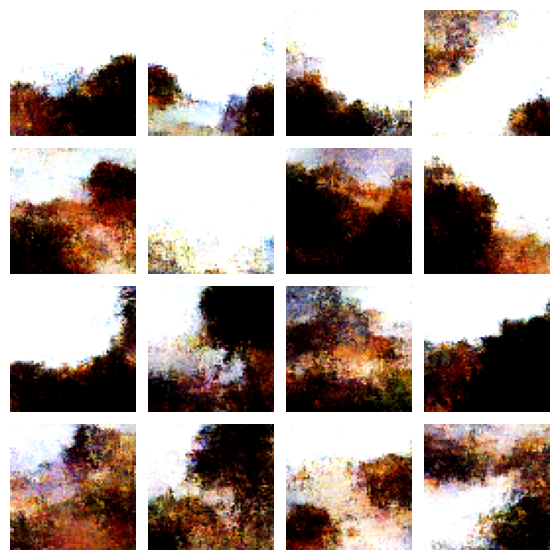

In [38]:
fig, axes = plt.subplots(4, 4, figsize=(6,6));
fig.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.1, hspace=0.1)
for i, ax in enumerate(axes.flat):
    ax.imshow(generated_images_history[-1][i])
    ax.axis('off')

plt.show()


Our model seems to have captured basic landscape features like the sky and trees quite well, considering its relatively modest size.

The following code snippet uses `matplotlib.animation.ArtistAnimation` to depict the time history of generated images, starting from initial random noise and ending with the final images.

In [34]:
from matplotlib.animation import ArtistAnimation
plt.rcParams['animation.embed_limit'] = 50

fig, axes = plt.subplots(4, 4, figsize=(6,6));
fig.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.1, hspace=0.1)

frames=[]
for t in range(len(generated_images_history)):
    ims = []
    for i, ax in enumerate(axes.flat):
        ax.axis('off')
        im = ax.imshow(generated_images_history[t][i], cmap='hot')
        ims.append(im)
    frames.append(ims)

anim = ArtistAnimation(fig, frames, interval=100)
plt.close()

To view the animation directly within a Jupyter notebook, we need to convert the animation (`anim`) into HTML format using the `to_jshtml()` method and then we can display it with IPython's `HTML` class.

To reduce notebook size, the cell below is commented out. You can check the generated animation (`diffusion.gif`) in the repository.

In [ ]:
# from IPython.display import HTML
# HTML(anim.to_jshtml())

In [36]:
# save the animation
anim.save("diffusion.gif")

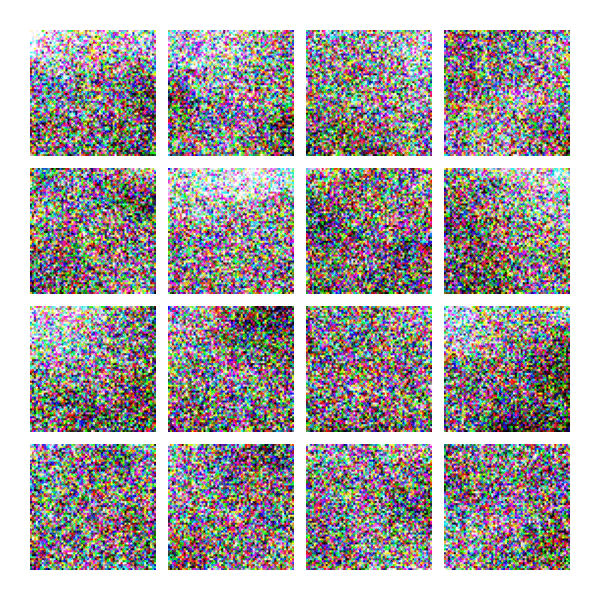

In [1]:
from IPython.display import Image, display

# display the saved GIF
display(Image('diffusion.gif'))
